<a href="https://colab.research.google.com/github/sileysa/PCVK26_26_SILEYSA/blob/main/Week02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [101]:
import cv2 as cv

In [102]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


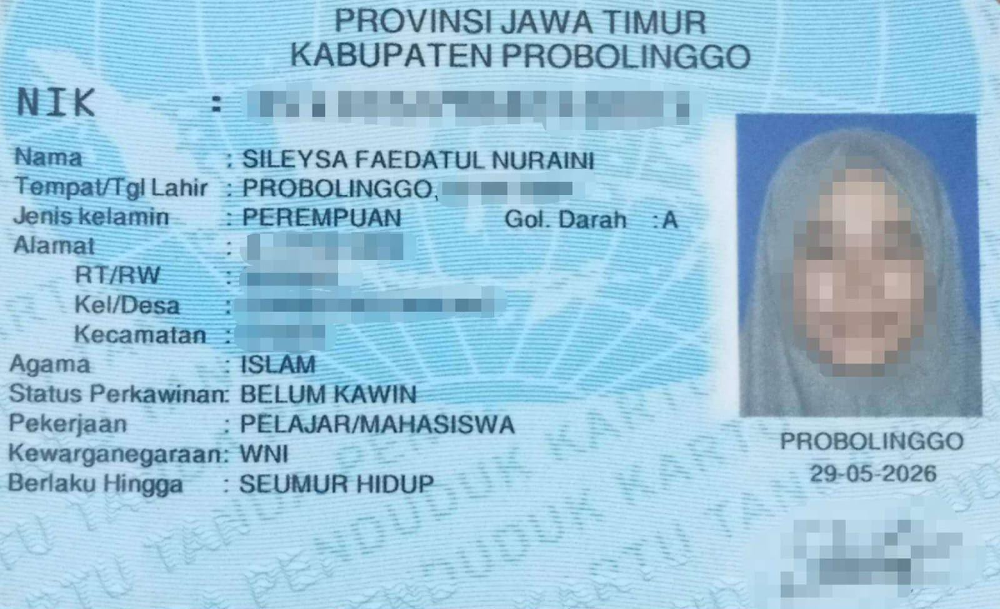

Resolusi gambar:  1600  x  975


In [103]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

img = cv.imread('/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/KTP1a.jpeg') # Updated path to Google Drive
cv2_imshow(img)

print("Resolusi gambar: ", img.shape[1], " x ", img.shape[0])

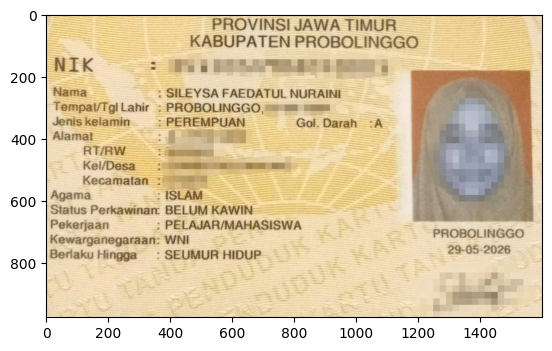

In [104]:
img = cv.imread('/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/KTP1a.jpeg') # Updated path to Google Drive
plt.imshow(img) #format warna BGR

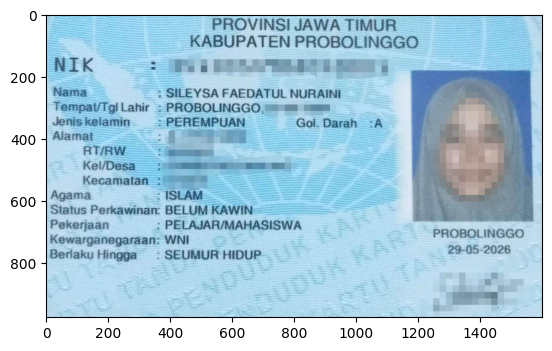

In [105]:
img = cv.imread('/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/KTP1a.jpeg') # Updated path to Google Drive
img2 = cv.cvtColor(img, cv.COLOR_BGR2RGB)   #konversi channel BGR -> RGB
plt.imshow(img2)

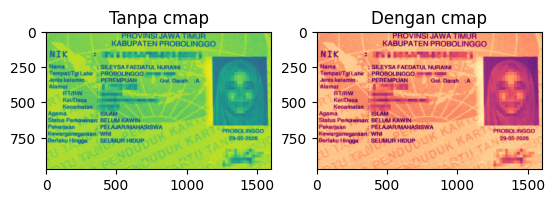

In [106]:
img_gray = cv.imread('/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/KTP1a.jpeg', cv.IMREAD_GRAYSCALE) # Updated path to Google Drive

# Tanpa cmap
plt.subplot(1, 2, 1)
plt.imshow(img_gray)
plt.title('Tanpa cmap')

# Dengan cmap
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap='magma')
plt.title('Dengan cmap')

plt.show()

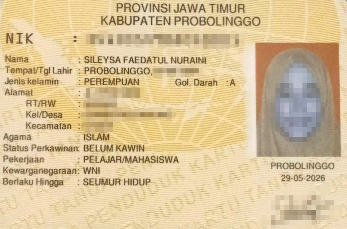

In [107]:
imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB) #konversi BGR ke RGB
img_output = cv.resize(imgRGB, (347, 229))
cv2_imshow(img_output)

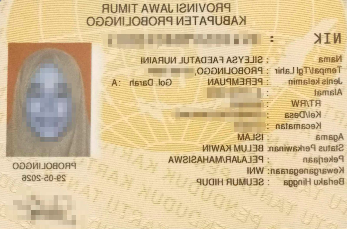

In [108]:
imgFlip = cv.flip(img_output, 1)
cv2_imshow(imgFlip)

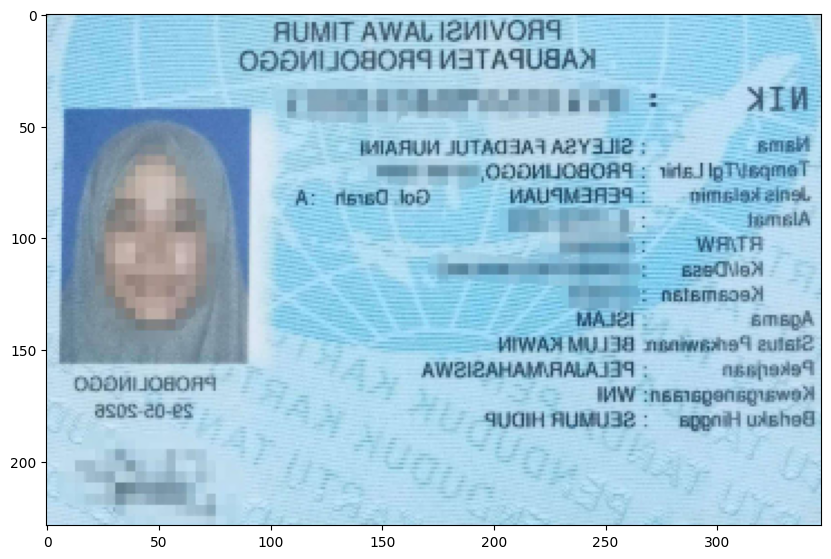

In [109]:
imgFlip = cv.flip(img_output, 1)

#tampilkan ukuran canvas yang lebih besar
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(1,1,1)
ax.imshow(imgFlip)

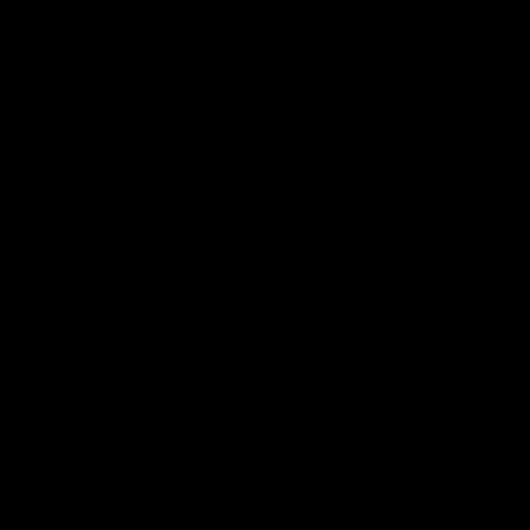

In [110]:
black_img = np.zeros(shape=(530, 530, 3), dtype=np.int16)
cv2_imshow(black_img)

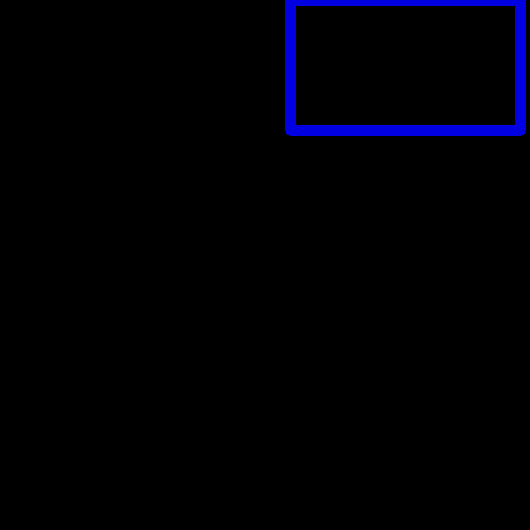

In [111]:
#perhatikan koordinat titik2 dan pt2
cv.rectangle(black_img, pt1=(290, 0), pt2=(520, 130), color=(225,0,0), thickness=10)
cv2_imshow(black_img)

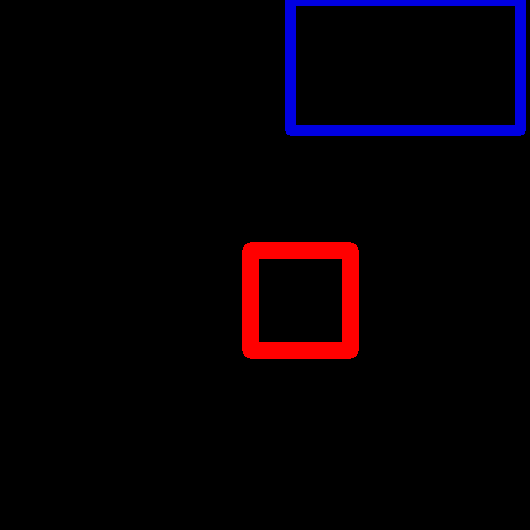

In [112]:
cv.rectangle(black_img, pt1=(250, 250), pt2=(350, 350), color=(0,0,255), thickness=15)
cv2_imshow(black_img)

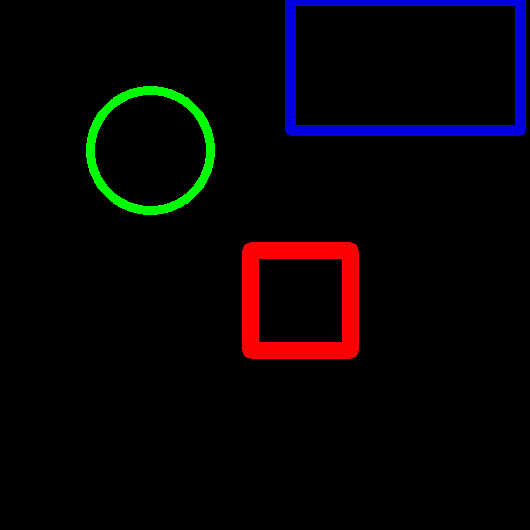

In [113]:
cv.circle(black_img, center=(150, 150), radius=60, color=(0,255,0), thickness=8)
cv2_imshow(black_img)

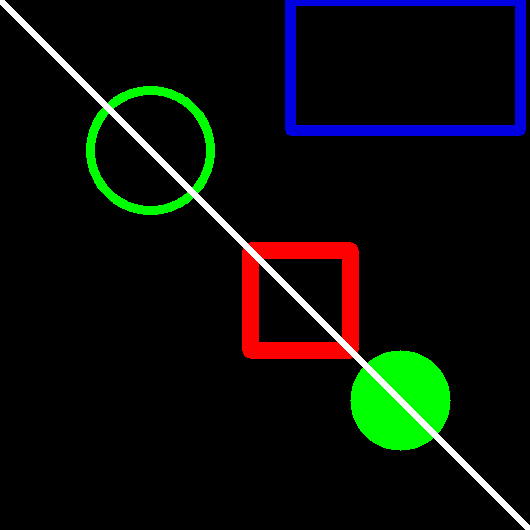

In [114]:
cv.circle(black_img, center=(400, 400), radius=50, color=(0,255,0), thickness=-1)
cv.line(black_img, pt1=(0,0), pt2=(530, 530), color=(255,255,255), thickness=5)
cv2_imshow(black_img)

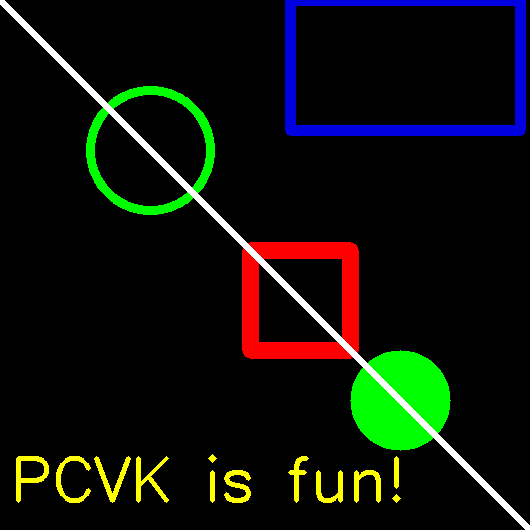

In [115]:
font = cv.FONT_HERSHEY_SIMPLEX
cv.putText(black_img, text='PCVK is fun!', org=(10,500), fontFace=font, fontScale=2,
           color=(0,255,255), thickness=3, lineType=cv.LINE_AA)
cv2_imshow(black_img)

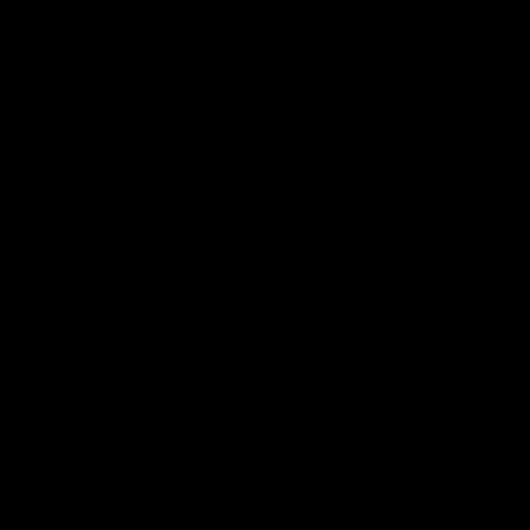

In [116]:
black_img2 = np.zeros(shape=(530, 530, 3), dtype=np.int32)
cv2_imshow(black_img2)

In [117]:
vertices = np.array([[150, 350], [250, 250], [450, 350], [250, 450]], dtype=np.int32)
vertices

array([[150, 350],
       [250, 250],
       [450, 350],
       [250, 450]], dtype=int32)

In [118]:
pts = vertices.reshape((-1, 1, 2)) # nilai 2 untuk menunjukkan bahwa tiap titik dibuat 3 channel yang mewakili R, G, dan B
pts

array([[[150, 350]],

       [[250, 250]],

       [[450, 350]],

       [[250, 450]]], dtype=int32)

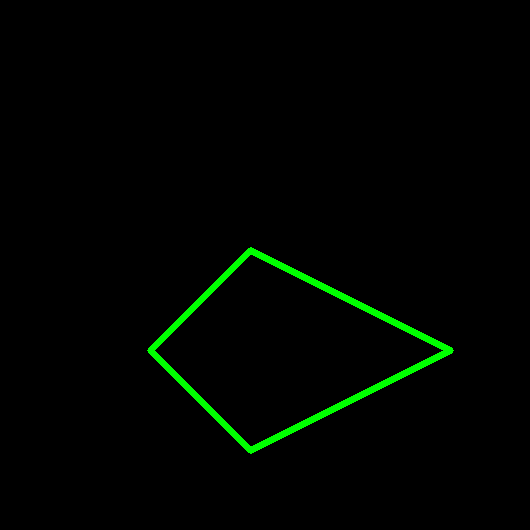

In [119]:
cv.polylines(black_img2, [pts], isClosed=True, color=(0,255,0), thickness=5)
cv2_imshow(black_img2)

# PERTANYAAN PRAKTIKUM

1. Tampilkan satu citra bebas menggunakan cv2_imshow() dan plt.imshow()
tanpa konversi warna apa pun. Mengapa hasilnya berbeda? Buktikan dengan
mencetak nilai satu piksel yang sama dari kedua cara pembacaan tersebut.

Hasil cv2_imshow() dan plt.imshow() dapat terlihat berbeda karena OpenCV membaca dan menyimpan citra berwarna dalam urutan kanal BGR (Blue, Green, Red), sedangkan Matplotlib menganggap citra berwarna menggunakan urutan RGB (Red, Green, Blue). Oleh karena itu, ketika citra dari cv2.imread() langsung ditampilkan menggunakan plt.imshow() tanpa konversi, kanal merah dan biru tertukar.



Shape: (975, 1600, 3)
Pixel [100,100] BGR: [249 226 188]


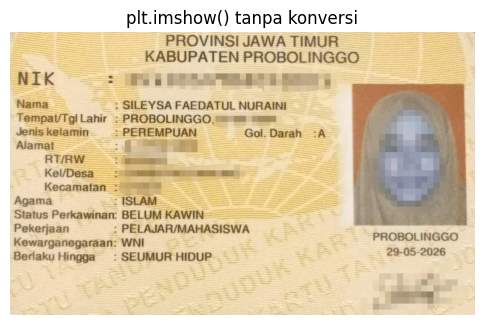

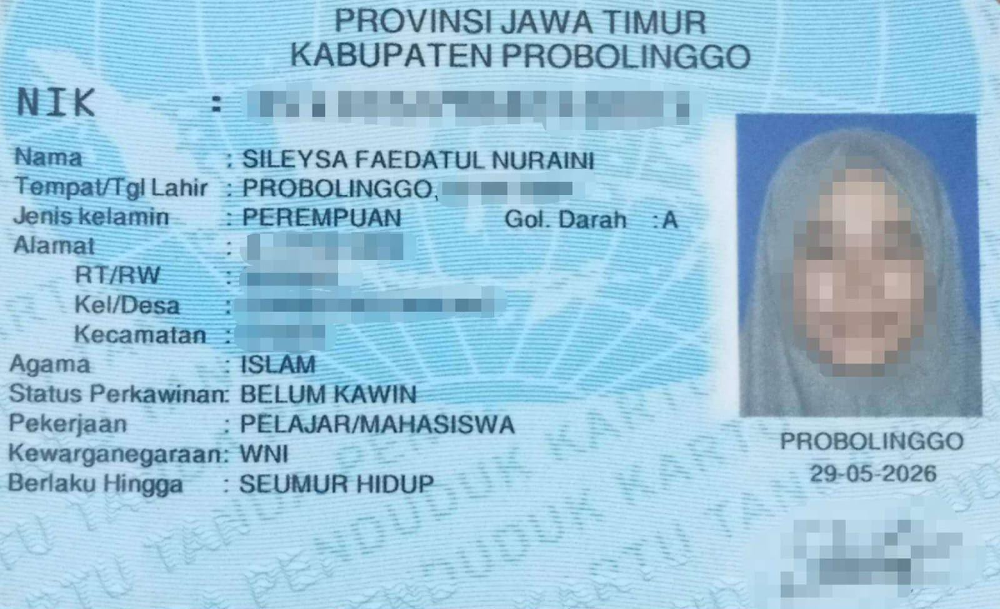

In [120]:
import cv2 as cv
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow # Ensure cv2_imshow is imported as well

img = cv.imread('/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/KTP1a.jpeg')

print("Shape:", img.shape)
print("Pixel [100,100] BGR:", img[100, 100])

plt.figure(figsize=(6, 4))
plt.imshow(img)
plt.title("plt.imshow() tanpa konversi")
plt.axis("off")
plt.show()

cv2_imshow(img)

In [121]:
y = 100
x = 100

print("Nilai piksel pada [y,x]:", img[y, x])
print("B:", img[y, x][0])
print("G:", img[y, x][1])
print("R:", img[y, x][2])

Nilai piksel pada [y,x]: [249 226 188]
B: 249
G: 226
R: 188


2. Buat kanvas hitam berukuran sama dengan tipe data int16 dan int32.
Bandingkan dtype, min(), max(), dan nbytes keduanya. Apakah tampilannya
berbeda? Apakah ukuran memorinya berbeda? Jelaskan alasannya.

Kedua citra memiliki ukuran dan nilai piksel yang sama karena sama-sama dibuat menggunakan np.zeros(). Nilai minimum dan maksimum pada kedua kanvas adalah 0 karena seluruh piksel berwarna hitam. Perbedaannya terdapat pada dtype dan penggunaan memori. int16 membutuhkan 2 byte per elemen, sedangkan int32 membutuhkan 4 byte per elemen. Oleh karena itu, citra int32 menggunakan memori dua kali lebih besar daripada int16.

=== INT16 ===
dtype : int16
min   : 0
max   : 0
nbytes: 2400000

=== INT32 ===
dtype : int32
min   : 0
max   : 0
nbytes: 4800000


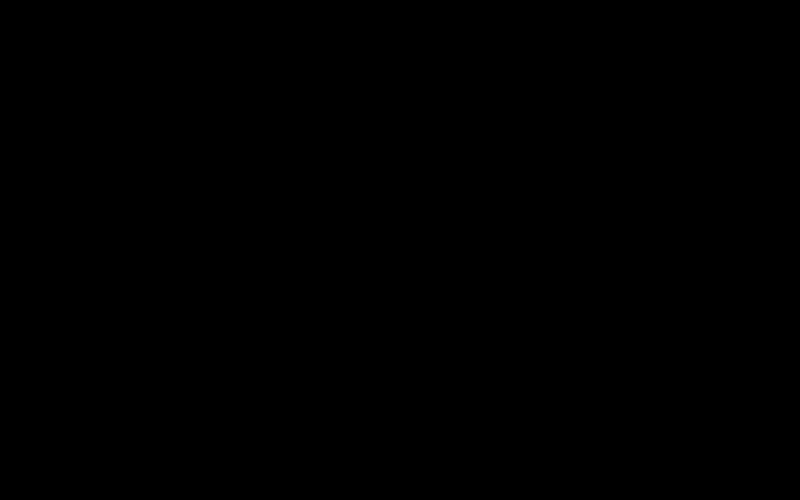

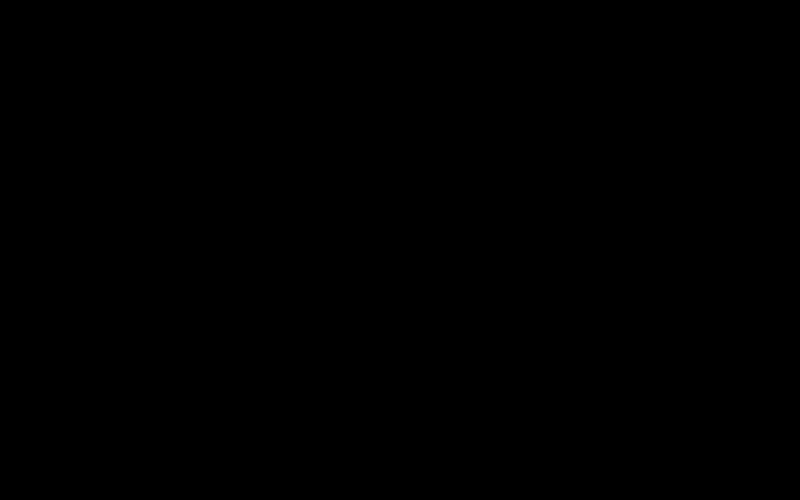

In [122]:
import numpy as np
from google.colab.patches import cv2_imshow

tinggi = 500
lebar = 800

img_int16 = np.zeros((tinggi, lebar, 3), dtype=np.int16)
img_int32 = np.zeros((tinggi, lebar, 3), dtype=np.int32)

print("=== INT16 ===")
print("dtype :", img_int16.dtype)
print("min   :", img_int16.min())
print("max   :", img_int16.max())
print("nbytes:", img_int16.nbytes)

print("\n=== INT32 ===")
print("dtype :", img_int32.dtype)
print("min   :", img_int32.min())
print("max   :", img_int32.max())
print("nbytes:", img_int32.nbytes)

cv2_imshow(img_int16)
cv2_imshow(img_int32)


3. Apa kegunaan baris from google.colab.patches import cv2_imshow, dan
mengapa cv2.imshow() bawaan OpenCV tidak dapat dipakai di Google Colab?

cv2_imshow digunakan untuk menampilkan gambar pada Google Colab. Fungsi tersebut merupakan pengganti cv2.imshow() karena cv2.imshow() membutuhkan jendela GUI pada sistem operasi, sedangkan Google Colab berjalan pada lingkungan notebook berbasis browser sehingga tidak menyediakan jendela GUI tersebut.



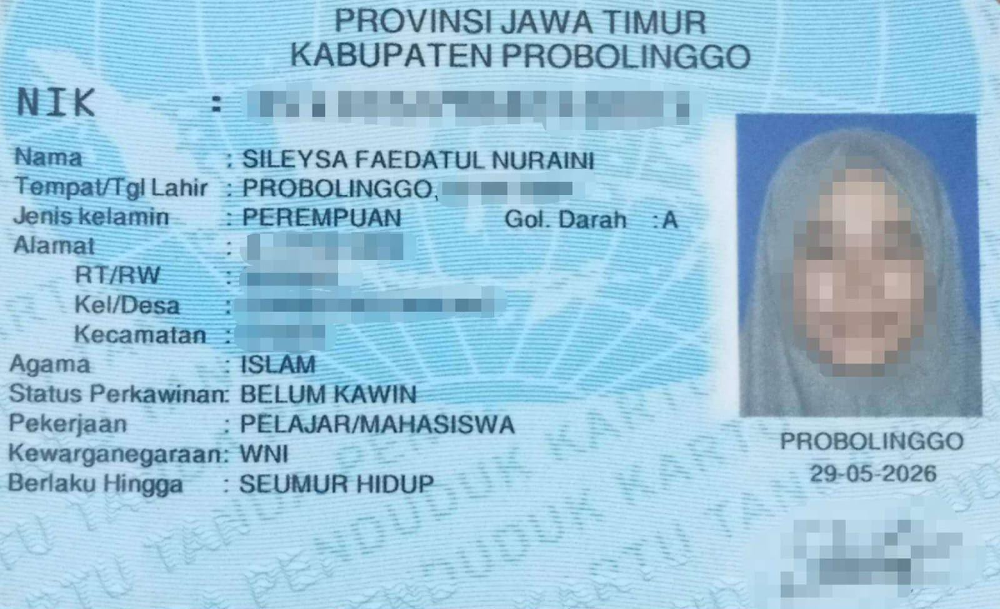

In [123]:
import cv2 as cv
from google.colab.patches import cv2_imshow

img = cv.imread('/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/KTP1a.jpeg') # Assuming this is the correct path for img
cv2_imshow(img)

4. Citra yang dibaca dengan skimage.io.imread() ditampilkan berdampingan
dengan hasil cv2.cvtColor(img, cv2.COLOR_BGR2RGB) atas citra yang
sama. Manakah yang menampilkan warna sebenarnya, dan manakah yang
kanalnya tertukar? Buktikan dengan nilai piksel, bukan dengan pengamatan
visual saja.

skimage.io.imread() membaca citra berwarna dalam urutan RGB, sedangkan cv2.imread() membaca dalam urutan BGR. Setelah citra OpenCV dikonversi menggunakan cv2.cvtColor(img_opencv, cv2.COLOR_BGR2RGB), urutan kanalnya menjadi RGB sehingga nilainya sesuai dengan hasil pembacaan skimage.



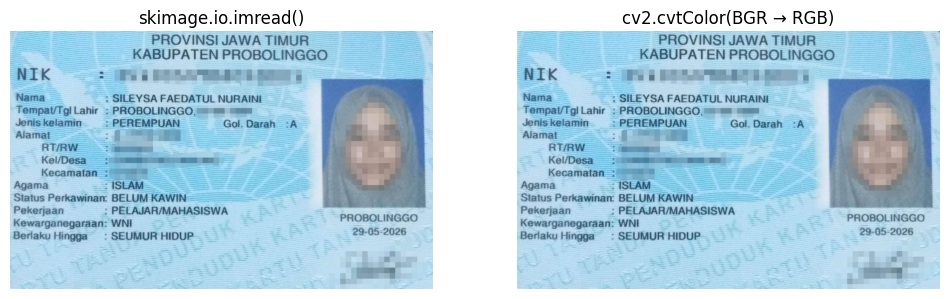

In [124]:
from skimage import io
import cv2 as cv # Import cv2
import matplotlib.pyplot as plt

image = '/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/KTP1a.jpeg'

img_skimage = io.imread(image)
img_opencv = cv.imread(image)

img_bgr2rgb = cv.cvtColor(img_opencv, cv.COLOR_BGR2RGB)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_skimage)
plt.title("skimage.io.imread()")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_bgr2rgb)
plt.title("cv2.cvtColor(BGR → RGB)")
plt.axis("off")

plt.show()

In [125]:
y = 100
x = 100

print("skimage RGB      :", img_skimage[y, x])
print("OpenCV BGR        :", img_opencv[y, x])
print("OpenCV setelah RGB:", img_bgr2rgb[y, x])

skimage RGB      : [188 226 249]
OpenCV BGR        : [249 226 188]
OpenCV setelah RGB: [188 226 249]


5. Setelah citra ditampilkan dengan figsize yang jauh lebih besar, apakah nilai
img.shape ikut berubah? Jelaskan perbedaan antara mengubah ukuran citra
dan mengubah ukuran tampilan.

Nilai img.shape tidak berubah meskipun ukuran tampilan diperbesar menggunakan figsize. figsize hanya mengubah ukuran kanvas ketika citra ditampilkan pada Matplotlib, bukan jumlah piksel citra. Untuk benar-benar mengubah ukuran atau jumlah piksel citra harus menggunakan cv2.resize().

Shape sebelum ditampilkan: (975, 1600, 3)


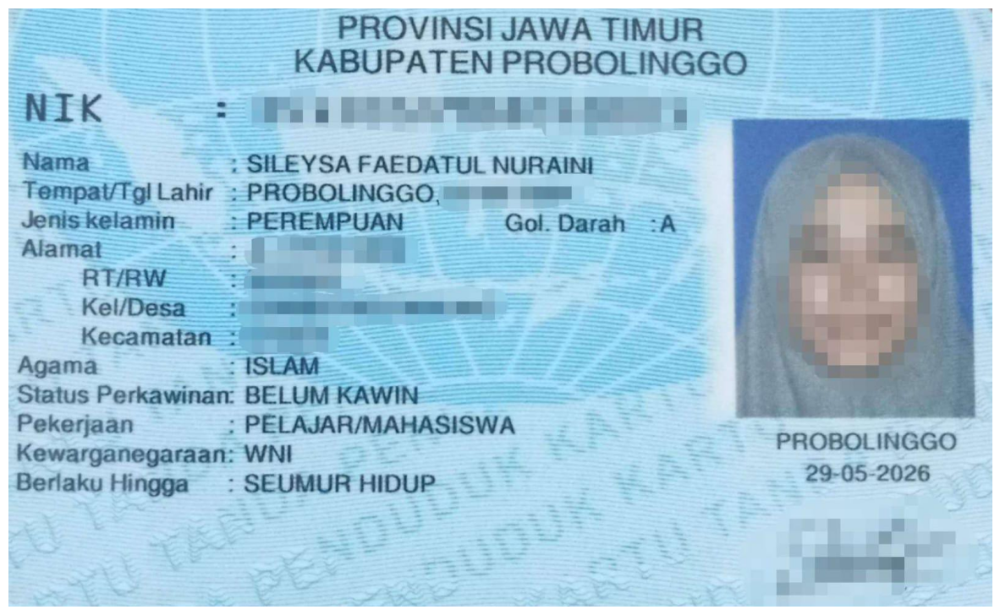

Shape setelah ditampilkan: (975, 1600, 3)


In [126]:
import cv2 as cv
import matplotlib.pyplot as plt

image = '/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/KTP1a.jpeg'
img = cv.imread(image)

print("Shape sebelum ditampilkan:", img.shape)

plt.figure(figsize=(15, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

print("Shape setelah ditampilkan:", img.shape)

# TUGAS PRAKTIKUM - Penerapan

1. Tampilkan citra hanya pada kombinasi kanal Merah-Biru dan kanal Hijau- Biru saja, dengan kanal yang tidak dipakai dinolkan. Susun keduanya berdampingan dalam satu figure yang diberi judul.

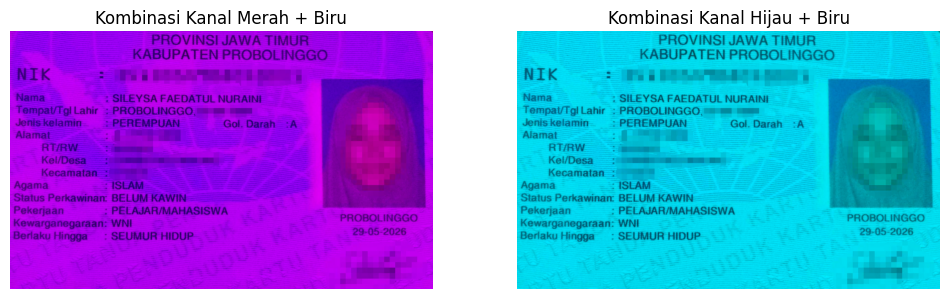

In [127]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image = '/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/KTP1a.jpeg'
img = cv.imread(image)

# BGR
B, G, R = cv.split(img)

# Merah + Biru (Green di nolkan)
red_blue = np.zeros_like(img)
red_blue[:, :, 0] = B  # Blue channel
red_blue[:, :, 2] = R  # Red channel

# Hijau + Biru (Red di nolkan)
green_blue = np.zeros_like(img)
green_blue[:, :, 0] = B  # Blue channel
green_blue[:, :, 1] = G  # Green channel

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(red_blue, cv.COLOR_BGR2RGB))
plt.title("Kombinasi Kanal Merah + Biru")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(green_blue, cv.COLOR_BGR2RGB))
plt.title("Kombinasi Kanal Hijau + Biru")
plt.axis("off")

plt.show()

2. Tampilkan citra dalam tiga bentuk pencerminan: vertikal, horizontal, dan
keduanya, dalam satu figure berisi tiga subplot yang masing-masing diberi
label.

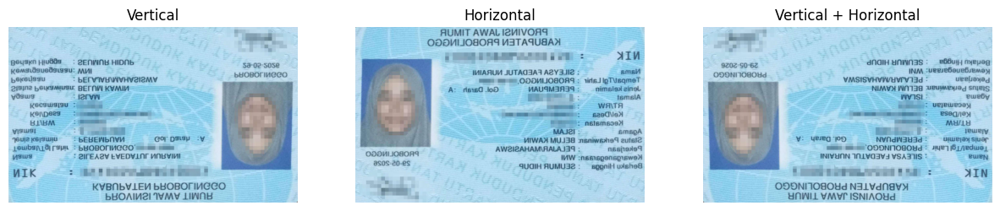

In [128]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image = '/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/KTP1a.jpeg'
img = cv.imread(image)

flip_vertical = cv.flip(img, 0)
flip_horizontal = cv.flip(img, 1)
flip_both = cv.flip(img, -1)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(flip_vertical, cv.COLOR_BGR2RGB))
plt.title("Vertical")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(flip_horizontal, cv.COLOR_BGR2RGB))
plt.title("Horizontal")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(flip_both, cv.COLOR_BGR2RGB))
plt.title("Vertical + Horizontal")
plt.axis("off")

plt.show()

3. Gambarkan sebuah rectangle dan sebuah circle pada bagian wajah /
badan dari foto aktivitas Anda sendiri (bukan pasfoto), lalu tambahkan
teks berisi nama Anda dengan pilihan font, ukuran, dan warna yang Anda
tentukan sendiri.

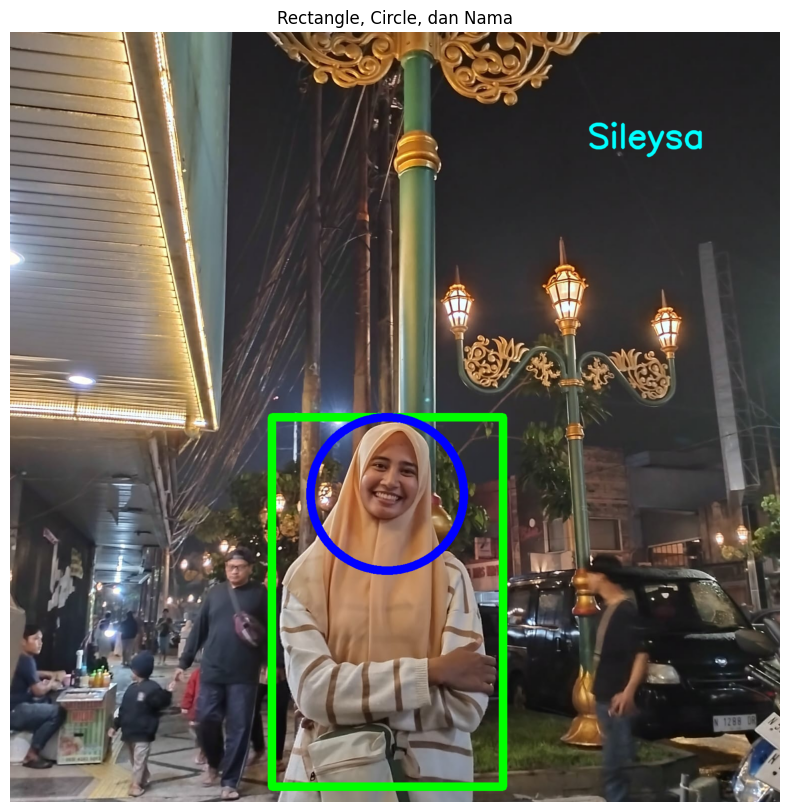

In [129]:
import cv2 as cv
import matplotlib.pyplot as plt

image_path = '/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/Foto_Aktivitas.jpg'
img = cv.imread(image_path)

# Mendapatkan dimensi gambar setelah dimuat
h, w = img.shape[:2]

# Membuat salinan agar gambar asli tidak berubah
hasil = img.copy()

# =========================
# RECTANGLE PADA BAGIAN BADAN
# =========================

x1 = int(w * 0.34)
y1 = int(h * 0.50)

x2 = int(w * 0.64)
y2 = int(h * 0.98)

ketebalan = max(2, int(min(w, h) * 0.01))

cv.rectangle(
    hasil,
    (x1, y1),
    (x2, y2),
    (0, 255, 0),
    ketebalan
)

# =========================
# CIRCLE PADA BAGIAN WAJAH
# =========================

center_x = int(w * 0.49)
center_y = int(h * 0.60)

radius = int(min(w, h) * 0.10)

cv.circle(
    hasil,
    (center_x, center_y),
    radius,
    (255, 0, 0),
    ketebalan
)

# =========================
# MENAMBAHKAN NAMA
# =========================

nama = "Sileysa"

font_scale = min(w, h) / 700
text_thickness = max(2, int(min(w, h) / 300))

cv.putText(
    hasil,
    nama,
    (int(w * 0.75), int(h * 0.150)),
    cv.FONT_HERSHEY_SIMPLEX,
    font_scale,
    (255, 255, 0),
    text_thickness,
    cv.LINE_AA
)

# Menampilkan hasil
plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(hasil, cv.COLOR_BGR2RGB))
plt.title("Rectangle, Circle, dan Nama")
plt.axis("off")
plt.show()

# TUGAS PRAKTIKUM - Analisa

Apakah ukuran gambar berubah ketika gambar hanya diperbesar tampilannya menggunakan figsize?

Tidak berubah, karena figsize hanya memperbesar tampilan, bukan jumlah piksel gambar.

Shape awal: (975, 1600, 3)


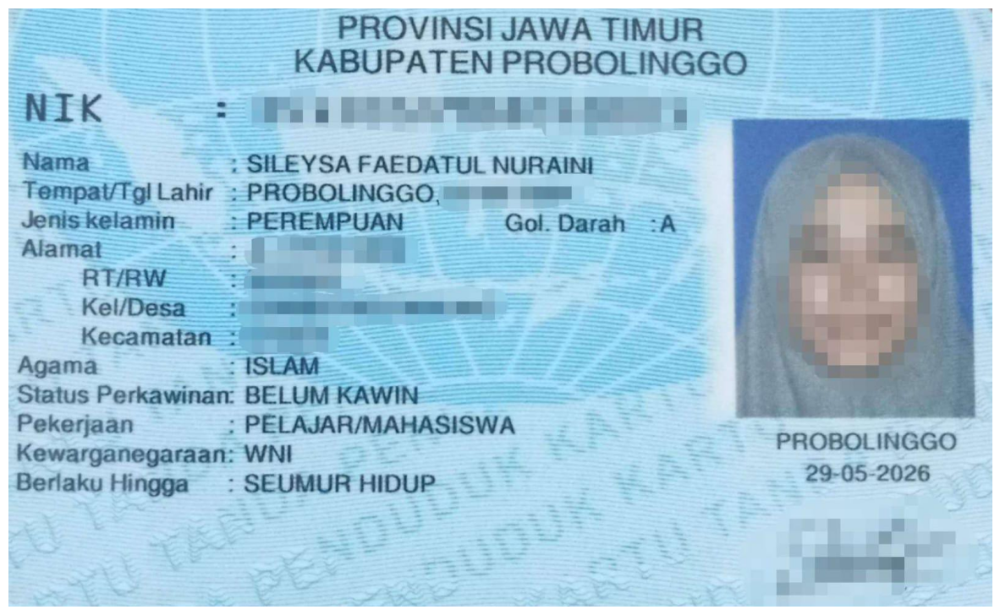

Shape setelah ditampilkan: (975, 1600, 3)


In [130]:
import cv2 as cv
import matplotlib.pyplot as plt

image = '/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/KTP1a.jpeg'
img = cv.imread(image)

print("Shape awal:", img.shape)

plt.figure(figsize=(15, 15))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

print("Shape setelah ditampilkan:", img.shape)

# TUGAS PRAKTIKUM - Aplikasi

Studi Kasus 1: Panitia sebuah kegiatan perlu membubuhkan label identitas pada
ratusan foto dokumentasi. Foto berasal dari beberapa kamera dan ponsel,
sehingga ukurannya bermacam-macam. Label harus terlihat seimbang pada
semua foto tanpa disetel satu per satu. Fungsi yang sama dikenakan pada dua
citra berbeda ukuran. Tinggi bar dan ukuran huruf ikut menyesuaikan, sehingga
proporsinya tetap sama. Silakan melakukan akuisisi data sendiri, setiap anak
harus menggunakan image yang berbeda-beda

In [131]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img1 = cv2.imread('/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/Potret.jpg')
img2 = cv2.imread('/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/Lanskap.jpg')

print("Ukuran gambar 1:", img1.shape)
print("Ukuran gambar 2:", img2.shape)

def buat_label_identitas(img):

    # Mengambil tinggi dan lebar gambar
    h, w = img.shape[:2]

    # Tinggi bar = 1/12 dari tinggi gambar
    bar = h // 12

    # Membuat salinan gambar
    hasil = img.copy()

    # Membuat bar hitam di bagian bawah
    cv2.rectangle(
        hasil,
        (0, h - bar),
        (w, h),
        (0, 0, 0),
        -1
    )

    # Font
    font = cv2.FONT_HERSHEY_SIMPLEX

    # Ukuran teks menyesuaikan tinggi bar
    font_scale = bar / 28

    # Ketebalan teks menyesuaikan ukuran gambar
    thickness = max(1, bar // 18)

    # Posisi teks
    margin_x = int(w * 0.02)
    baseline_y = h - bar // 2 + thickness // 2

    # Menambahkan teks
    cv2.putText(
        hasil,
        "Dokumentasi PCVK - 2026",
        (margin_x, baseline_y),
        font,
        font_scale,
        (255, 255, 255),
        thickness,
        cv2.LINE_AA
    )

    return hasil

Ukuran gambar 1: (5376, 3584, 3)
Ukuran gambar 2: (359, 640, 3)


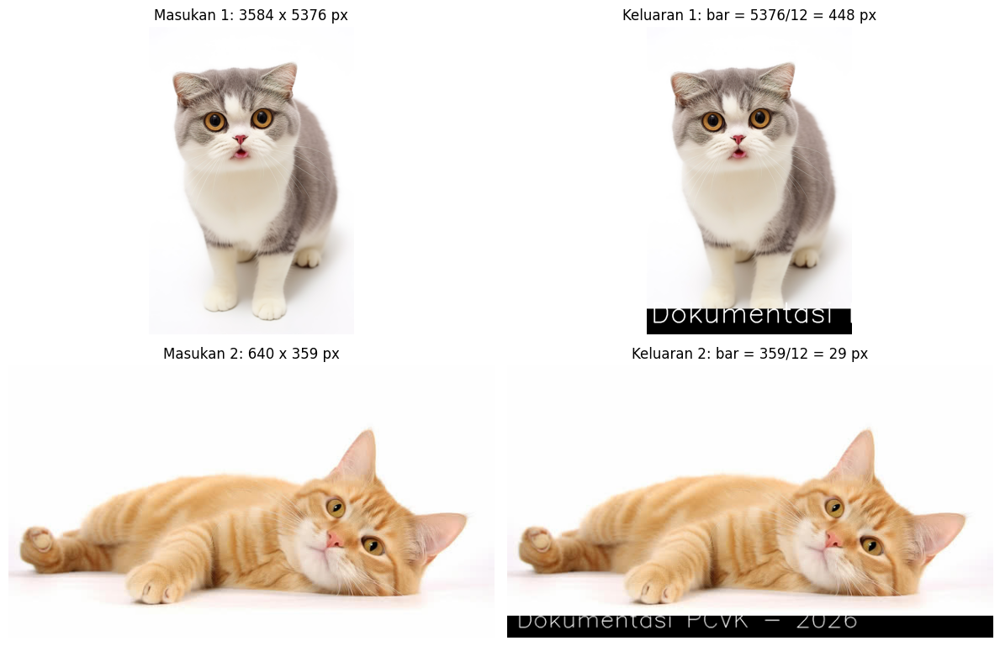

In [132]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img1 = cv.imread('/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/Potret.jpg')
img2 = cv.imread('/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/Lanskap.jpg')

hasil1 = buat_label_identitas(img1)
hasil2 = buat_label_identitas(img2)

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title(f"Masukan 1: {img1.shape[1]} x {img1.shape[0]} px")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(hasil1, cv2.COLOR_BGR2RGB))

h1 = img1.shape[0]
bar1 = h1 // 12

plt.title(f"Keluaran 1: bar = {h1}/12 = {bar1} px")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.title(f"Masukan 2: {img2.shape[1]} x {img2.shape[0]} px")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(cv2.cvtColor(hasil2, cv2.COLOR_BGR2RGB))

h2 = img2.shape[0]
bar2 = h2 // 12

plt.title(f"Keluaran 2: bar = {h2}/12 = {bar2} px")
plt.axis("off")

plt.tight_layout()
plt.show()

Marketplace seperti Tokopedia dan Shopee menampilkan foto
produk dalam bingkai persegi 1:1. Foto penjual yang berukuran potrait atau
lanskap akan terpotong atau terlihat tidak proporsional bila diunggah begitu saja.
Bangun program yang mengubah foto berukuran apa pun menjadi thumbnail
persegi tanpa mengubah rasio aslinya, dengan sisa ruang diisi kanvas berwarna.
Dalam hal ini, rasio asli tetap terjaga, citra terpasang tepat di tengah kanvas,
tambahkan logo nama toko berukuran proporsional pada gambar.

In [133]:
def buat_thumbnail(img, nama_toko):
    h, w = img.shape[:2]

    # Sisi canvas persegi mengikuti sisi terpanjang
    sisi = max(h, w)

    # Membuat canvas persegi
    canvas = np.full(
        (sisi, sisi, 3),
        255,
        dtype=np.uint8
    )

    # Skala agar gambar masuk ke canvas
    scale = min(sisi / w, sisi / h)

    new_w = max(1, int(w * scale))
    new_h = max(1, int(h * scale))

    # Resize dengan rasio tetap
    resized = cv.resize(
        img,
        (new_w, new_h),
        interpolation=cv.INTER_AREA
    )

    # Posisi agar tepat di tengah
    x = (sisi - new_w) // 2
    y = (sisi - new_h) // 2

    canvas[
        y:y + new_h,
        x:x + new_w
    ] = resized

    # Ukuran logo berdasarkan ukuran canvas
    font_scale = max(0.5, sisi / 700)

    thickness = max(1, int(sisi / 250))

    # Posisi teks
    text_x = int(sisi * 0.05)
    text_y = int(sisi * 0.08)

    cv.putText(
        canvas,
        nama_toko,
        (text_x, text_y),
        cv.FONT_HERSHEY_SIMPLEX,
        font_scale,
        (0, 0, 0),
        thickness,
        cv.LINE_AA
    )

    return canvas

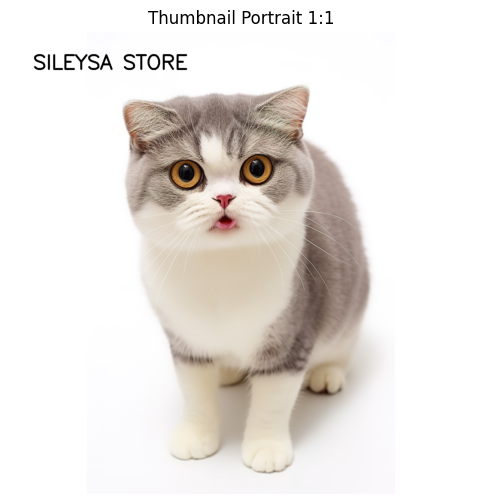

In [134]:
img_potret = cv.imread('/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/Potret.jpg')

thumbnail_potret = buat_thumbnail(
    img_potret,
    "SILEYSA STORE"
)

plt.figure(figsize=(6, 6))
plt.imshow(
    cv.cvtColor(
        thumbnail_potret,
        cv.COLOR_BGR2RGB
    )
)
plt.title("Thumbnail Portrait 1:1")
plt.axis("off")
plt.show()

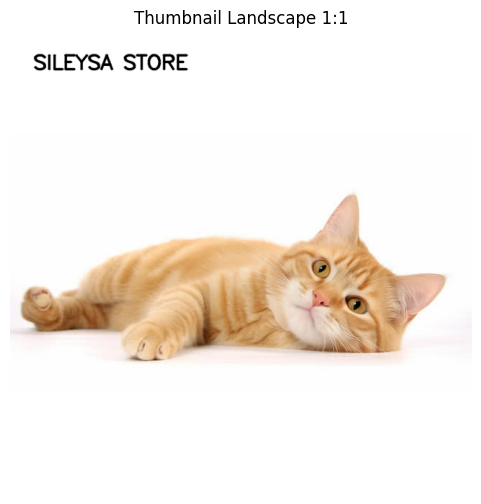

In [135]:
img_lanskap = cv.imread('/content/drive/MyDrive/SEMESTER_5/PCVK/Foto_KTP/Lanskap.jpg')

thumbnail_lanskap = buat_thumbnail(
    img_lanskap,
    "SILEYSA STORE"
)

plt.figure(figsize=(6, 6))
plt.imshow(
    cv.cvtColor(
        thumbnail_lanskap,
        cv.COLOR_BGR2RGB
    )
)
plt.title("Thumbnail Landscape 1:1")
plt.axis("off")
plt.show()

In [136]:
print("Ukuran thumbnail portrait :", thumbnail_potret.shape)
print("Ukuran thumbnail landscape:", thumbnail_lanskap.shape)

Ukuran thumbnail portrait : (5376, 5376, 3)
Ukuran thumbnail landscape: (640, 640, 3)
